# Feature Extraction ResNet50

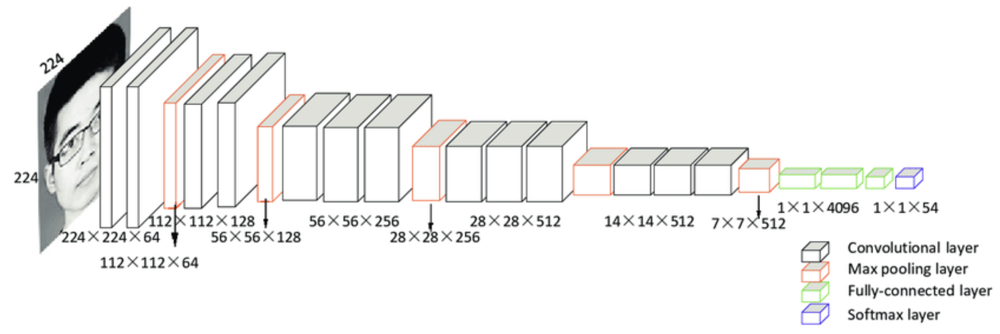

Pei, Zhao & Xu, Hang & Zhang, Yanning & Guo, Min & Yang, Yee-Hong. (2019). Face Recognition via Deep Learning Using Data Augmentation Based on Orthogonal Experiments. Electronics. 8. 1088. 10.3390/electronics8101088. 

## Data Loading

In [17]:
from src.preprocessing import CustomDataGenerator
from src.dataloader import read_train, read_val
X_train, y_train = read_train()
X_val, y_val = read_val()

## Network Extraction

Use keras to extract the network from the VGG16 model. The network is then saved to a file for later use.

In [1]:
import keras
from src import config
from keras.applications.resnet50 import preprocess_input
# set cpu as available physical device
import tensorflow as tf
tf.config.experimental.set_visible_devices([], 'GPU')

INPUT_SHAPE = (config.IMG_SIZE, config.IMG_SIZE, config.N_CHANNELS)
model = keras.applications.ResNet50(weights="imagenet", 
                                 include_top=True)

2023-11-29 22:11:51.879364: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-11-29 22:11:51.901970: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-11-29 22:11:52.250938: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-11-29 22:11:52.827974: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:268] failed call to cuInit: CUDA_ERROR_UNKNOWN: unknown error
2023-11-29 22:11:52.827999: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:168] retrievin

In [2]:
model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                       

In [33]:
len(['input_1',
 'conv1_pad',
 'conv1_conv',
 'conv1_bn',
 'conv1_relu',
 'pool1_pad',
 'pool1_pool',
 'conv2_block1_1_conv',])

8

In [32]:
[layer.name for layer in model.layers]


['input_1',
 'conv1_pad',
 'conv1_conv',
 'conv1_bn',
 'conv1_relu',
 'pool1_pad',
 'pool1_pool',
 'conv2_block1_1_conv',
 'conv2_block1_1_bn',
 'conv2_block1_1_relu',
 'conv2_block1_2_conv',
 'conv2_block1_2_bn',
 'conv2_block1_2_relu',
 'conv2_block1_0_conv',
 'conv2_block1_3_conv',
 'conv2_block1_0_bn',
 'conv2_block1_3_bn',
 'conv2_block1_add',
 'conv2_block1_out',
 'conv2_block2_1_conv',
 'conv2_block2_1_bn',
 'conv2_block2_1_relu',
 'conv2_block2_2_conv',
 'conv2_block2_2_bn',
 'conv2_block2_2_relu',
 'conv2_block2_3_conv',
 'conv2_block2_3_bn',
 'conv2_block2_add',
 'conv2_block2_out',
 'conv2_block3_1_conv',
 'conv2_block3_1_bn',
 'conv2_block3_1_relu',
 'conv2_block3_2_conv',
 'conv2_block3_2_bn',
 'conv2_block3_2_relu',
 'conv2_block3_3_conv',
 'conv2_block3_3_bn',
 'conv2_block3_add',
 'conv2_block3_out',
 'conv3_block1_1_conv',
 'conv3_block1_1_bn',
 'conv3_block1_1_relu',
 'conv3_block1_2_conv',
 'conv3_block1_2_bn',
 'conv3_block1_2_relu',
 'conv3_block1_0_conv',
 'conv3_

In [16]:
extractor = keras.Model(inputs=model.inputs, outputs=model.layers[80].output)

extractor.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                          

In [24]:
from skimage.transform import resize
import numpy as np

img = preprocess_input(resize(X_train[:2], (224, 224), preserve_range=True))
img = extractor.predict(img[np.newaxis, ...])
img.shape

ValueError: output_shape length cannot be smaller than the image number of dimensions

In [6]:
from skimage.transform import resize
import numpy as np
import pandas as pd

X_exp, y_exp = X_train[:3000], y_train[:3000]
# X_exp, y_exp = X_train_sample, y_train_sample
X_exp = [preprocess_input(resize(x, (224, 224), preserve_range=True)) for x in X_exp]
df_ext = pd.DataFrame(extractor.predict(np.array(X_exp)))
df_ext.shape

94/94 [==============================] - 34s 357ms/step


(3000, 2048)

In [7]:
import umap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
# sns.set(style='white', context='poster', rc={'figure.figsize':(10,5)})
reducer = umap.UMAP()
sc = StandardScaler()
embedding = reducer.fit_transform(sc.fit_transform(df_ext))
embedding.shape

/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


(3000, 2)

Text(0.5, 1.0, 'UMAP projection of VGG16 4096 features')

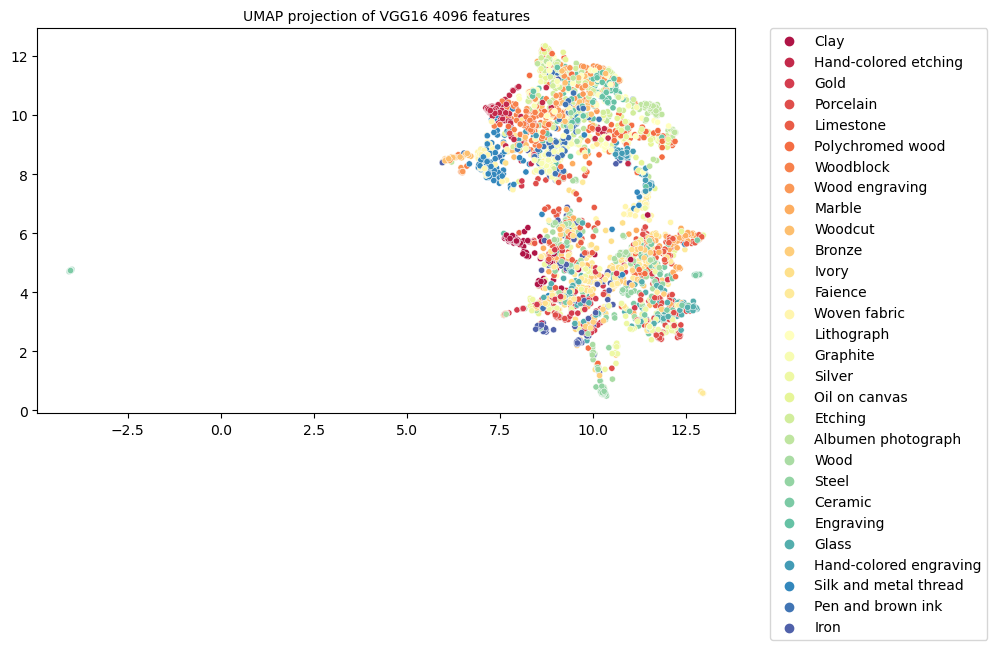

In [8]:
# REset the default matplotlib color cycle
plt.figure(figsize=(9,5))
y_labels = [config.LABELS[y] for y in y_exp]

sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=y_labels, marker='o', s=20,
                 palette='Spectral', legend='full')
# plt.legend([])
# place legend out of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('UMAP projection of VGG16 4096 features', fontsize=10)

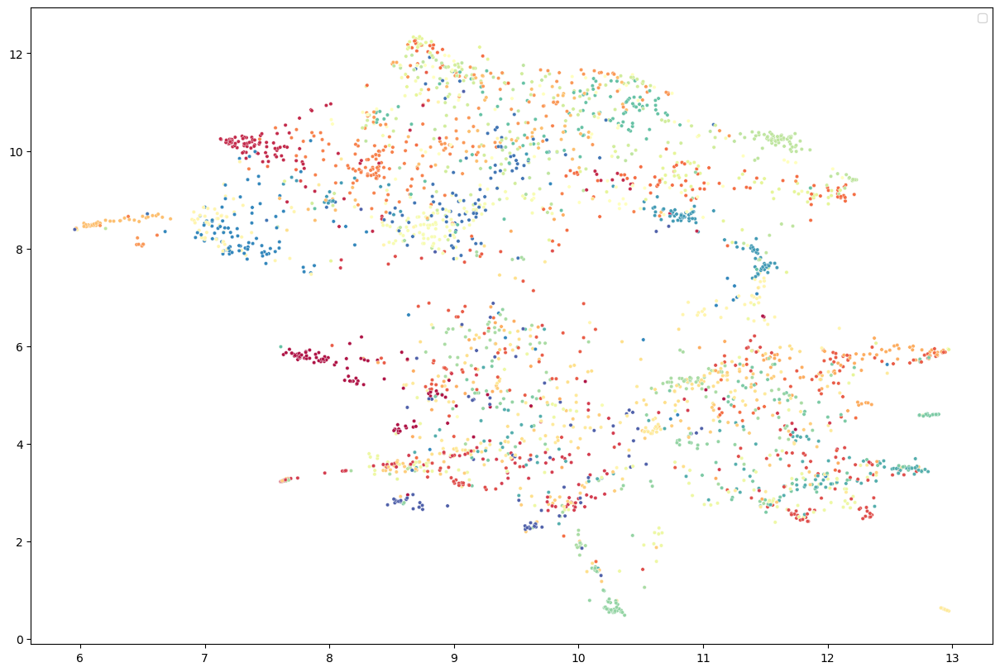

In [9]:
# REset the default matplotlib color cycle
plt.figure(figsize=(15,10))
y_labels = [config.LABELS[y] for y in y_exp[embedding[:, 0]>4]]
embedding_WO = embedding[embedding[:, 0]>4]
sns.scatterplot(x=embedding_WO[:, 0], y=embedding_WO[:, 1], hue=y_labels, marker='o', s=10,
                 palette='Spectral', legend='full')
plt.legend([])

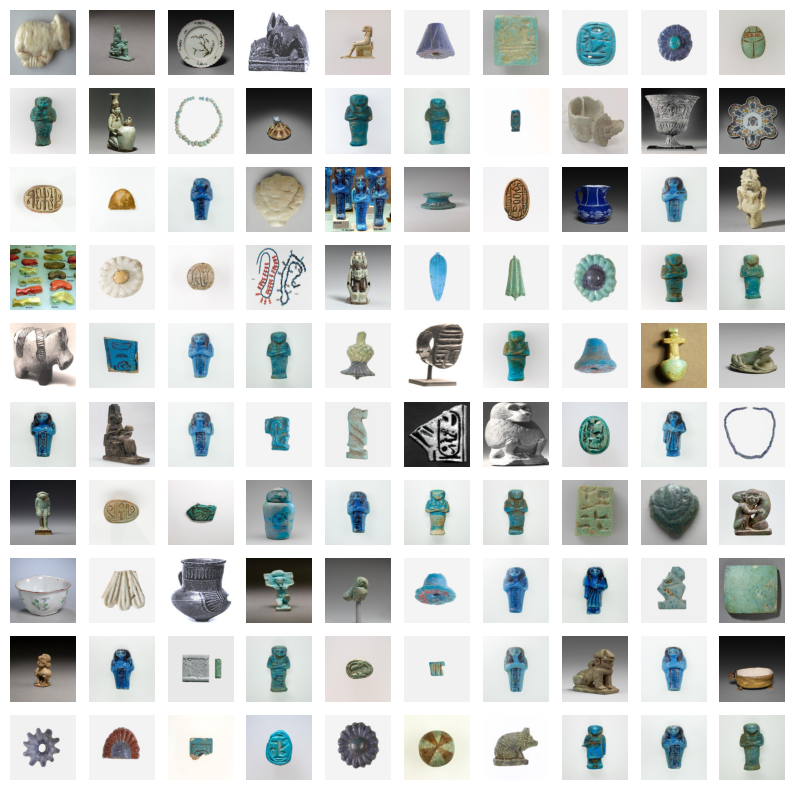

In [10]:
# PLot all the faience samples in a grid of 10x10

# REset the default matplotlib color cycle
X_exp_faience = X_train[y_train==6]
fig, ax = plt.subplots(10, 10, figsize=(10,10))
ax = ax.ravel()
for i, x in enumerate(X_exp_faience[:100]):
    ax[i].imshow(x)
    ax[i].axis('off')

In [11]:
config.LABELS.index('Faience')

6

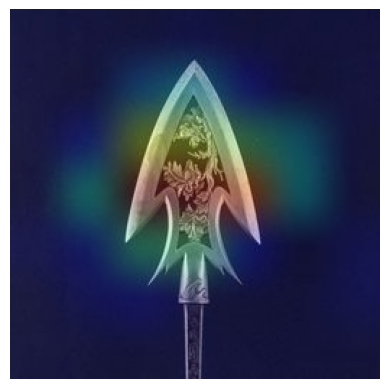

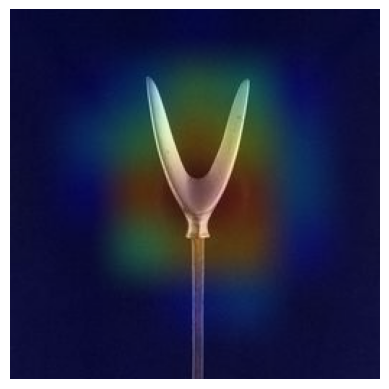

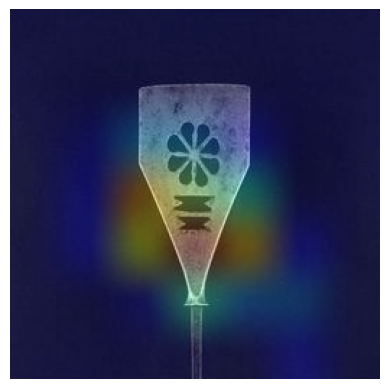

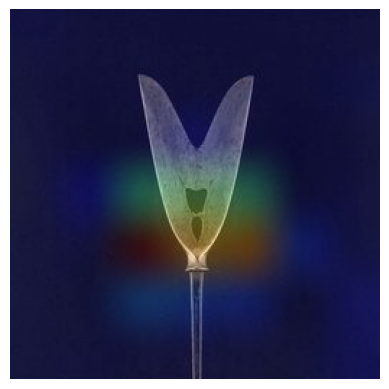

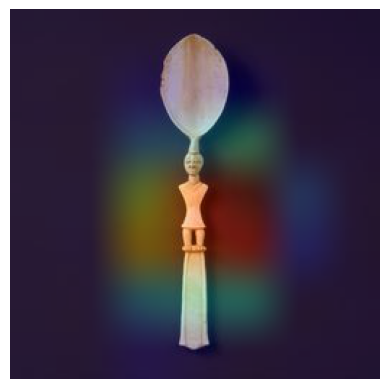

...

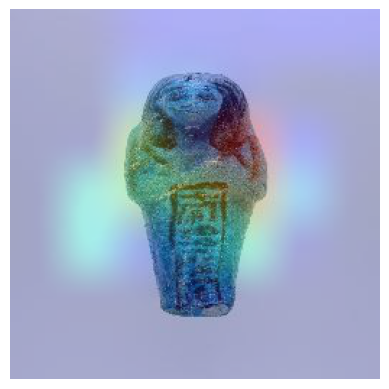

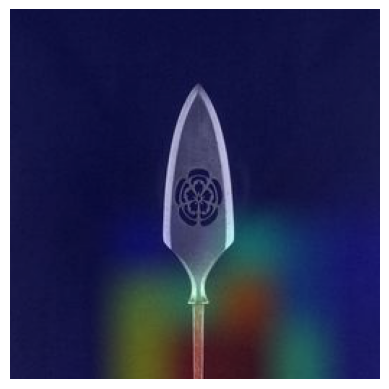

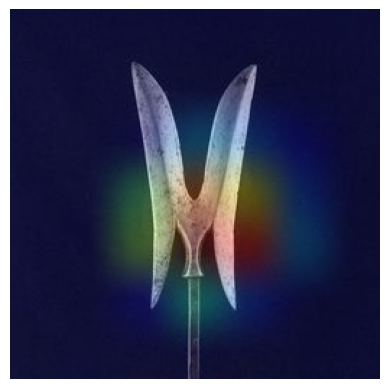

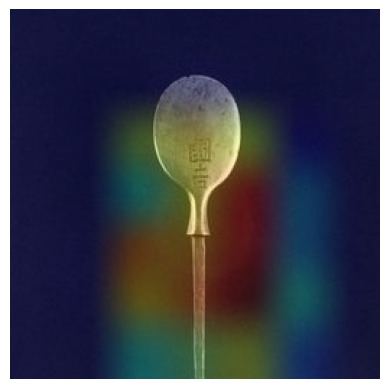

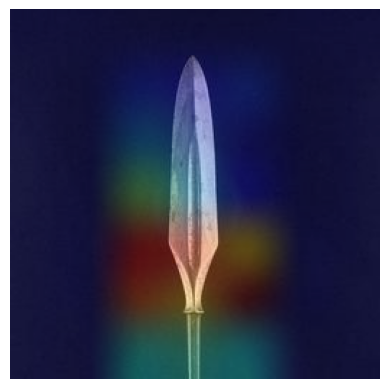

In [12]:
idx_outliers = np.where(embedding[:, 1] <1)[0]
X_outliers = X_train[idx_outliers, :]

def gradcam(model, img, img_proc):
    import re
    from src.analysis import make_gradcam_heatmap, save_and_display_gradcam
    img_orig = img.copy()
    conv_layer_name = [layer.name for layer in model.layers if re.match(".*_[Cc]onv.*$", layer.name)][-1]
    heatmap = make_gradcam_heatmap(img_proc, model, conv_layer_name, pred_index=None)
    superimposed = save_and_display_gradcam(img_orig, heatmap)
    return superimposed

for i, x in enumerate(X_outliers):
    # plt.imshow(x)
    x2 = gradcam(model, x, X_exp[idx_outliers[i]])
    plt.imshow(x2)
    plt.axis('off')
    plt.show()
    # plt.title("Outlier: {}".format(config.LABELS[y_exp[idx_outliers][i]]))
    # plt.show()

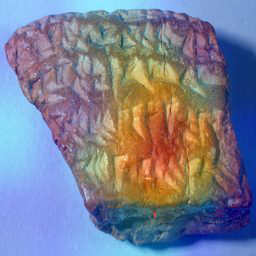

In [13]:
gradcam(model, X_train[0], X_exp[0])

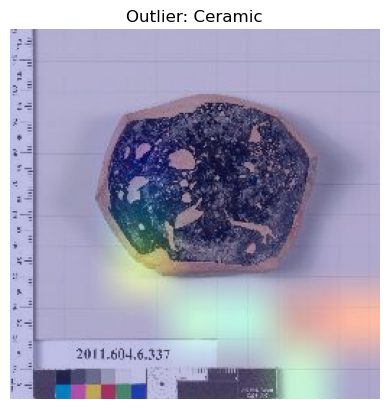

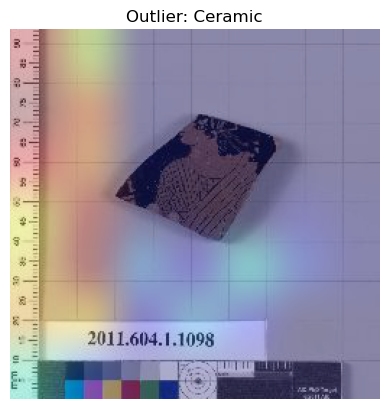

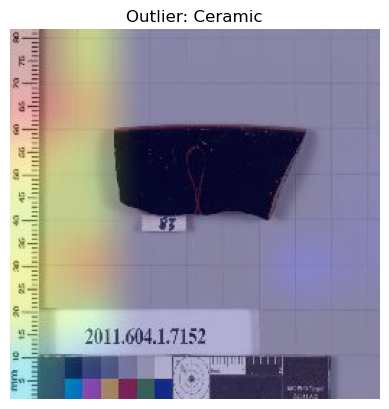

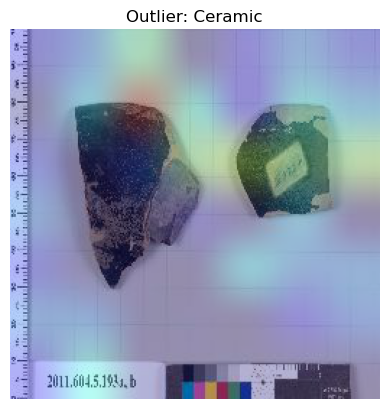

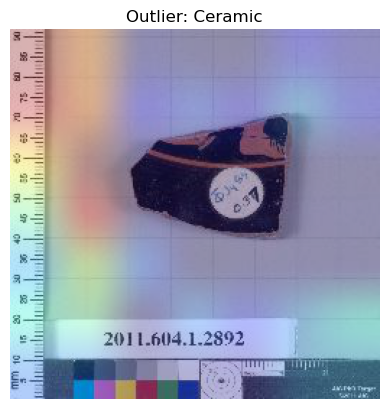

...

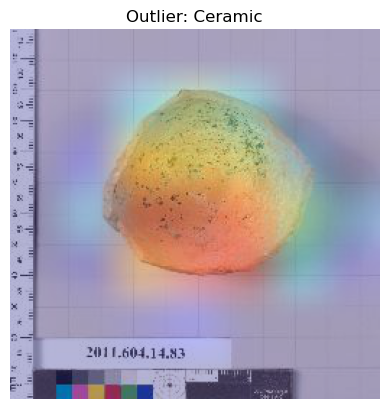

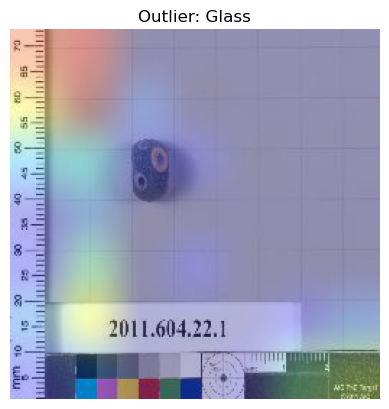

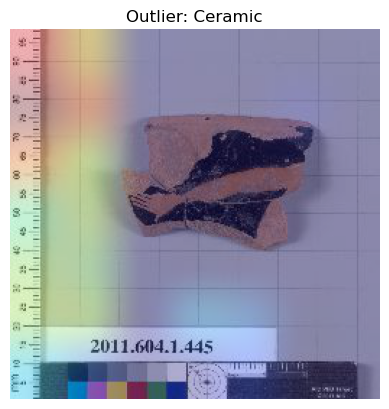

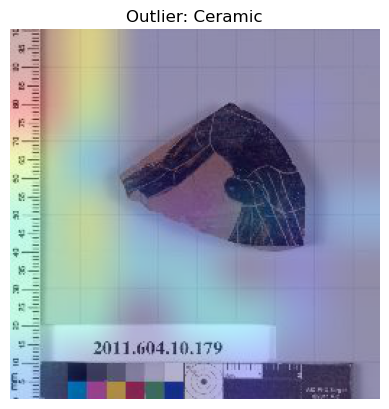

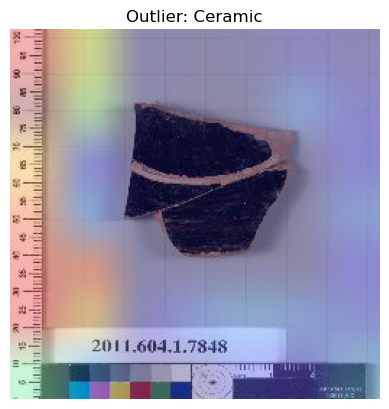

In [14]:
idx_outliers = np.where(embedding[:, 0] <4)[0]
X_outliers = X_train[idx_outliers, :]

for i, x in enumerate(X_outliers):
    gm = gradcam(model, x, X_exp[idx_outliers[i]])
    plt.imshow(gm)
    plt.title("Outlier: {}".format(config.LABELS[y_exp[idx_outliers][i]]))
    plt.axis('off')
    plt.show()

In [15]:
reducer = umap.UMAP()
sc = StandardScaler()
df_ext_wo = df_ext[embedding[:, 0]>4]
embedding_wo = reducer.fit_transform(sc.fit_transform(df_ext_wo))
embedding_wo.shape

(2980, 2)

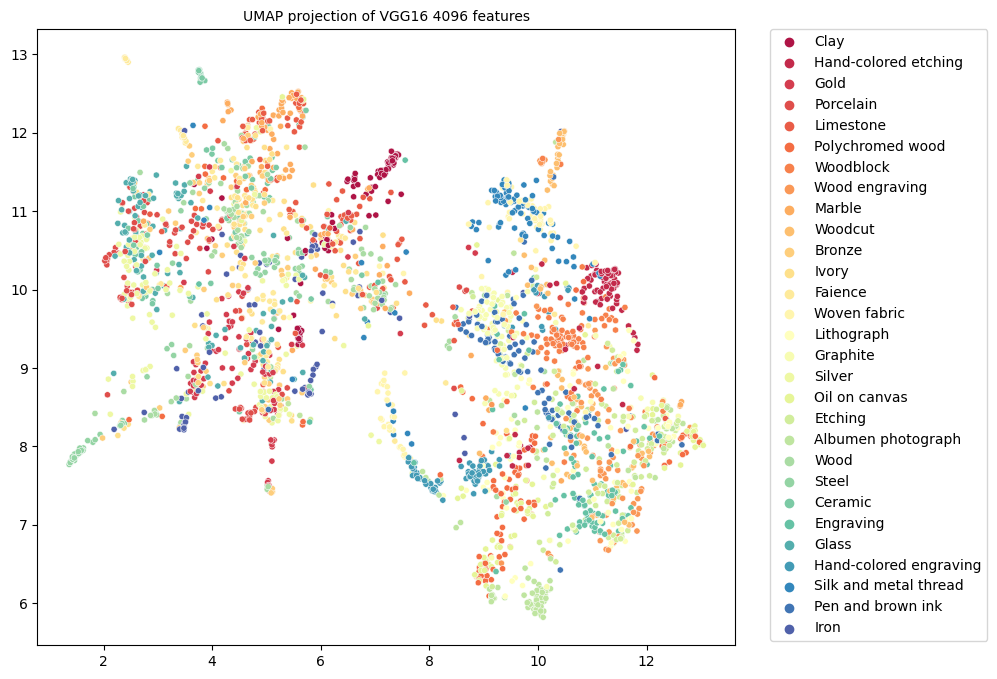

In [16]:
# REset the default matplotlib color cycle
plt.figure(figsize=(9,8))
y_labels = [config.LABELS[y] for y in y_exp[embedding[:, 0]>4]]

sns.scatterplot(x=embedding_wo[:, 0], y=embedding_wo[:, 1], hue=y_labels, marker='o', s=20,
                 palette='Spectral', legend='full')
# plt.legend([])
# place legend out of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('UMAP projection of VGG16 4096 features', fontsize=10)

# now using plotly
import plotly.express as px
import plotly.graph_objects as go

fig = px.scatter(x=embedding_wo[:, 0], y=embedding_wo[:, 1], color=y_labels)
fig.show()

In [17]:
reducer = umap.UMAP(n_components=3)
sc = StandardScaler()
df_ext_wo = df_ext[embedding[:, 0]>4]
embedding_wo = reducer.fit_transform(sc.fit_transform(df_ext_wo))
embedding_wo.shape

# Plot 3D t-SNE USING PLOTLY
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import numpy as np
import plotly.io as pio

pio.templates.default = "plotly_white"
fig = px.scatter_3d(embedding_wo, x=0, y=1, z=2, color=y_labels, opacity=1.)

fig.update_layout(
    title="3D UMAP projection of VGG16 features",
    scene = dict(
        xaxis_title='x',
        yaxis_title='y',
        zaxis_title='z'
    )
)

# REduce marker size
for i in range(len(fig.data)):
    fig.data[i].marker.size = 2

fig.show()

Text(0.5, 1.0, 'T-SNE projection of VGG16 4096 features')

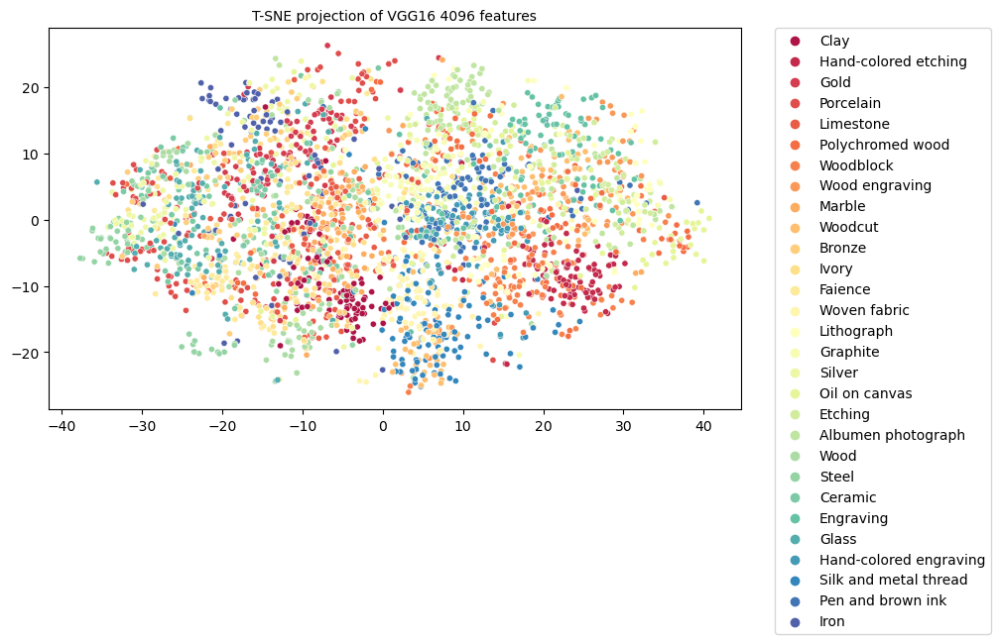

In [18]:
# Use t-sne to visualize the data
from sklearn.manifold import TSNE
tsne = TSNE(n_components=3, random_state=42)
sc = StandardScaler()
X_embedded = tsne.fit_transform(sc.fit_transform(df_ext_wo))
X_embedded.shape

# REset the default matplotlib color cycle
plt.figure(figsize=(9,5))
y_labels = [config.LABELS[y] for y in y_exp[embedding[:, 0]>4]]

sns.scatterplot(x=X_embedded[:, 0], y=X_embedded[:, 1], hue=y_labels, marker='o', s=20,
                 palette='Spectral', legend='full')
# plt.legend([])
# place legend out of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('T-SNE projection of VGG16 4096 features', fontsize=10)

In [19]:
%reload_ext plotly.express

In [20]:
# Plot 3D t-SNE USING PLOTLY
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import numpy as np
import plotly.io as pio

pio.templates.default = "plotly_white"
fig = px.scatter_3d(X_embedded, x=0, y=1, z=2, color=y_labels, opacity=1.)

fig.update_layout(
    title="3D t-SNE projection of VGG16 features",
    scene = dict(
        xaxis_title='x',
        yaxis_title='y',
        zaxis_title='z'
    )
)

# REduce marker size
for i in range(len(fig.data)):
    fig.data[i].marker.size = 2

fig.show()

In [21]:
# use pca to reduce the dimensionality
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
sc = StandardScaler()
X_embedded = pca.fit_transform(sc.fit_transform(df_ext_wo))
X_embedded.shape

pio.templates.default = "plotly_white"
fig = px.scatter_3d(X_embedded, x=0, y=1, z=2, color=y_labels, opacity=1.)

fig.update_layout(
    title="3D PCA projection of VGG16 features",
    scene = dict(
        xaxis_title='x',
        yaxis_title='y',
        zaxis_title='z'
    )
)

# REduce marker size
for i in range(len(fig.data)):
    fig.data[i].marker.size = 2

fig.show()

Text(0.5, 1.0, '0.9 Explained variance 555 components')

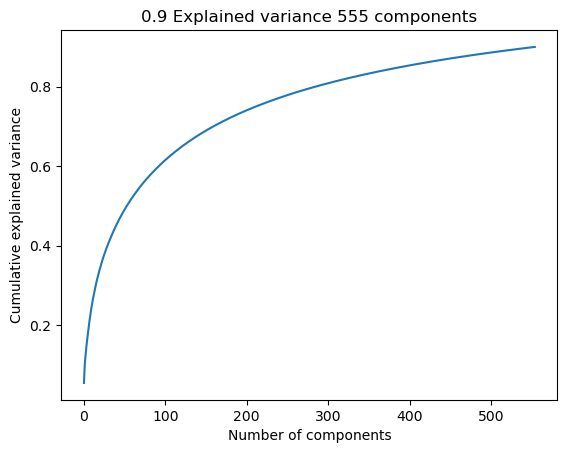

In [21]:
# plot explained variance for 100 components
pct_explained = .9
pca = PCA(n_components=pct_explained)
sc = StandardScaler()
pca.fit_transform(sc.fit_transform(df_ext_wo))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance');
plt.title(f"{pct_explained} Explained variance {pca.n_components_} components")

In [20]:
# X_ceramic = X_train[np.where(y_train == 2)[0], :]
# for x in X_ceramic:
#     plt.imshow(x)
#     plt.title("Ceramic")
#     plt.show()

## Add a classifier on top of the convolutional base

In [26]:
def add_classifier(model, ls_layers,
                   n_classes=config.N_CLASSES,
                   scale_orig=1/255.0):
    
    # Freeze the layers which you don't want to train. Here I am freezing the first 10 layers.
    model.trainable = False

    # Create new model on top
    inputs = keras.Input(shape=(config.IMG_SIZE, config.IMG_SIZE, config.N_CHANNELS))

    scale_layer = keras.layers.Rescaling(scale=scale_orig)
    x = scale_layer(inputs)

    model_layers = model.layers[1:]

    for layer in model_layers + ls_layers:
        x = layer(x)

    outputs = keras.layers.Dense(n_classes, activation='softmax')(x)
    model = keras.Model(inputs=inputs, outputs=outputs)
    
    return model

ls_classifiers = [keras.layers.Flatten(),
                  keras.layers.Dense(1024, activation='relu'),
                  keras.layers.Dropout(0.3),
                  keras.layers.Dense(512, activation='relu'),]

model_clas = add_classifier(model, ls_classifiers)
model_clas.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 256, 256, 3)       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584

## Train Model

In [27]:
LEARNING_RATE = 0.001
BATCH_SIZE = 32
EPOCHS = 10

train_generator = CustomDataGenerator(X_train, y_train, BATCH_SIZE)

In [28]:
model_clas = add_classifier(model, ls_classifiers)

# compile the model 
model_clas.compile(loss = "sparse_categorical_crossentropy", 
                    optimizer = keras.optimizers.legacy.Adam(lr=LEARNING_RATE), 
                    metrics=["accuracy"])

In [29]:
history = model_clas.fit(train_generator,
                            epochs=EPOCHS,
                            batch_size=BATCH_SIZE,
                            validation_data=(X_val, y_val),
                            verbose=1)

Epoch 1/10
635/635 [==============================] - 76s 119ms/step - loss: 2.1324 - accuracy: 0.3725 - val_loss: 1.4923 - val_accuracy: 0.5262
Epoch 2/10
635/635 [==============================] - 76s 119ms/step - loss: 1.5492 - accuracy: 0.5072 - val_loss: 1.3392 - val_accuracy: 0.5800
Epoch 3/10
635/635 [==============================] - 76s 119ms/step - loss: 1.3105 - accuracy: 0.5681 - val_loss: 1.3035 - val_accuracy: 0.5614
Epoch 4/10
635/635 [==============================] - 76s 119ms/step - loss: 1.1903 - accuracy: 0.6089 - val_loss: 1.2067 - val_accuracy: 0.6014
Epoch 5/10
635/635 [==============================] - 76s 120ms/step - loss: 1.0473 - accuracy: 0.6536 - val_loss: 1.1321 - val_accuracy: 0.6324
Epoch 6/10
635/635 [==============================] - 76s 119ms/step - loss: 0.9632 - accuracy: 0.6780 - val_loss: 1.1344 - val_accuracy: 0.6303
Epoch 7/10
635/635 [==============================] - 75s 119ms/step - loss: 0.8988 - accuracy: 0.6989 - val_loss: 1.1150 - val_ac

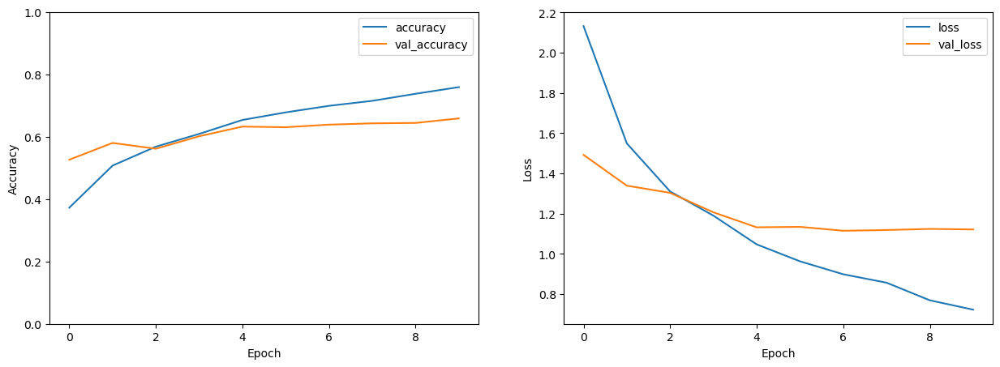

In [30]:
%reload_ext src.results
from src.results import plot_history
plot_history(model_clas);